In [8]:
!pip install fredapi > /dev/null

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 500)
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']

from fredapi import Fred

fred_key = '49c19100f7cc1a62f62e4528282cf2d9'


In [2]:
fred = Fred(api_key=fred_key)
fred.search('S&P', order_by='popularity')

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2024-02-14,2024-02-14,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2024-02-13,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-02-14 08:54:02-06:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2024-02-14,2024-02-14,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2023-11-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2024-01-30 08:11:02-06:00,87,"For more information regarding the index, plea..."
SP500,SP500,2024-02-14,2024-02-14,S&P 500,2014-02-18,2024-02-14,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2024-02-14 19:11:00-06:00,83,The observations for the S&P 500 represent the...
MEHOINUSA672N,MEHOINUSA672N,2024-02-14,2024-02-14,Real Median Household Income in the United States,1984-01-01,2022-01-01,Annual,A,2022 CPI-U-RS Adjusted Dollars,2022 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2023-09-12 13:48:02-05:00,82,Household data are collected as of March. As ...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2024-02-14,2024-02-14,ICE BofA US High Yield Index Effective Yield,1996-12-31,2024-02-13,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-02-14 08:54:06-06:00,82,This data represents the effective yield of th...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCT1501MO,GCT1501MO,2024-02-14,2024-02-14,High School Graduate or Higher for Missouri,2006-01-01,2022-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2023-09-14 12:38:11-05:00,3,Estimate of educational attainment for populat...
HC01ESTVC1639073,HC01ESTVC1639073,2024-02-14,2024-02-14,High School Graduate or Higher (5-year estimat...,2010-01-01,2022-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2023-12-07 10:39:55-06:00,3,Estimate of educational attainment for populat...
RKNANPTZA666NRUG,RKNANPTZA666NRUG,2024-02-14,2024-02-14,Capital Stock at Constant National Prices for ...,1960-01-01,2019-01-01,Annual,A,Millions of 2017 U.S. Dollars,Mil. of 2017 U.S. $,Not Seasonally Adjusted,NSA,2023-02-27 14:32:55-06:00,3,Source ID: rkna When using these data in your...


<Axes: title={'center': 'S&P 500'}>

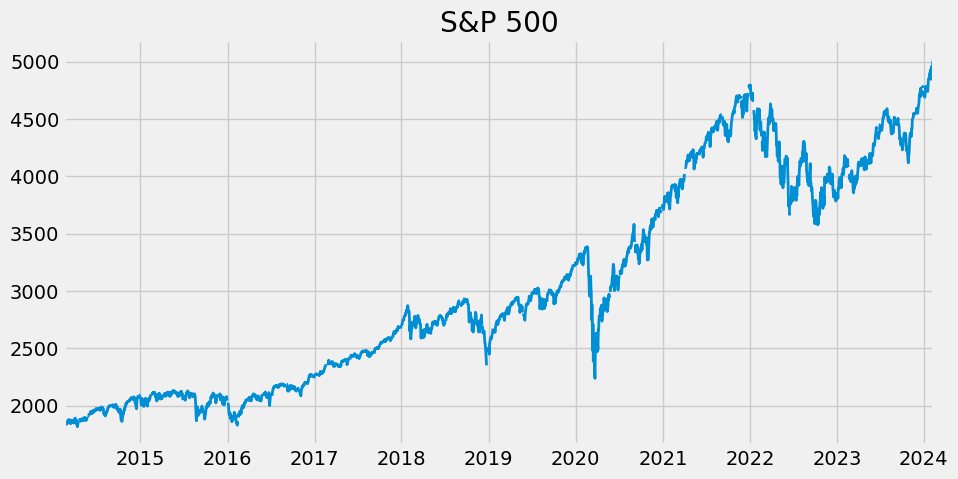

In [3]:
sp500 = fred.get_series(series_id='SP500')
sp500.plot(figsize=(10,5), title='S&P 500', lw = 2)

In [4]:
unemp_df = fred.search('unemployment rate in state', filter =('frequency', 'Monthly'))
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate in')]
unemp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CAUR,CAUR,2024-02-14,2024-02-14,Unemployment Rate in California,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:42:01-06:00,64,None
TXUR,TXUR,2024-02-14,2024-02-14,Unemployment Rate in Texas,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:41:02-06:00,54,None
NYUR,NYUR,2024-02-14,2024-02-14,Unemployment Rate in New York,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:41:02-06:00,53,None
FLUR,FLUR,2024-02-14,2024-02-14,Unemployment Rate in Florida,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:42:02-06:00,52,None
OHUR,OHUR,2024-02-14,2024-02-14,Unemployment Rate in Ohio,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:41:03-06:00,42,None
MIUR,MIUR,2024-02-14,2024-02-14,Unemployment Rate in Michigan,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:42:03-06:00,39,None
NCUR,NCUR,2024-02-14,2024-02-14,Unemployment Rate in North Carolina,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:41:04-06:00,37,None
ILUR,ILUR,2024-02-14,2024-02-14,Unemployment Rate in Illinois,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:42:05-06:00,32,None
MAUR,MAUR,2024-02-14,2024-02-14,Unemployment Rate in Massachusetts,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-25 12:42:03-06:00,38,None


<Axes: title={'center': 'Unemployment Rate'}>

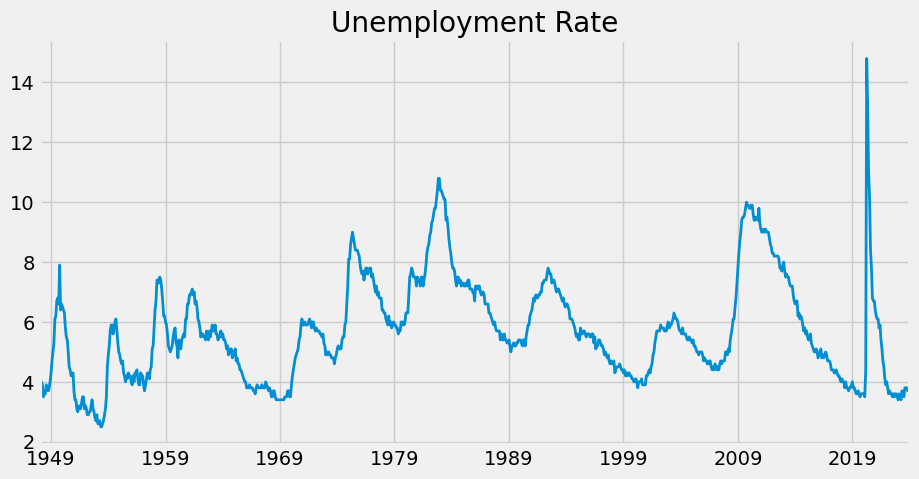

In [5]:
unrate = fred.get_series('UNRATE')
unrate.plot(figsize=(10,5), title='Unemployment Rate', lw = 2)

In [6]:
unemp_df.index

Index(['CAUR', 'TXUR', 'NYUR', 'FLUR', 'OHUR', 'MIUR', 'NCUR', 'ILUR', 'MAUR',
       'PAUR', 'ALUR', 'NJUR', 'GAUR', 'AZUR', 'COUR', 'WIUR', 'VAUR', 'MNUR',
       'KYUR', 'WAUR', 'TNUR', 'MDUR', 'ORUR', 'SCUR', 'IAUR', 'MOUR', 'LAUR',
       'NMUR', 'LASMT261982000000003', 'NVUR', 'ARUR', 'UTUR', 'INUR', 'PRUR',
       'WVUR', 'AKUR', 'OKUR', 'MTUR', 'NDUR', 'HIUR', 'KSUR', 'MSUR', 'DCUR',
       'CTUR', 'NEUR', 'MEUR', 'WYUR', 'DEUR', 'IDUR', 'SDUR', 'RIUR', 'VTUR',
       'NHUR', 'LASMT391746000000003', 'CSOUUR', 'CMWRUR', 'CWSTUR', 'CNERUR',
       'CNEWUR'],
      dtype='object', name='series id')

In [8]:
all_results = []

for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
unemp_states = pd.concat(all_results, axis=1).drop(['PRUR','LASMT261982000000003','LASMT391746000000003', 'CMWRUR','CNEWUR','CSOUUR','CNERUR','CWSTUR'],axis=1)

In [9]:
id_to_state = unemp_df['title'].str.replace('Unemployment Rate in ', '').to_dict()
unemp_states.columns = [id_to_state[c] for c in unemp_states.columns]

In [10]:
#plot states unemployment rate
px.line(unemp_states)

# Pull April 2020 Unemployment Rate Per State

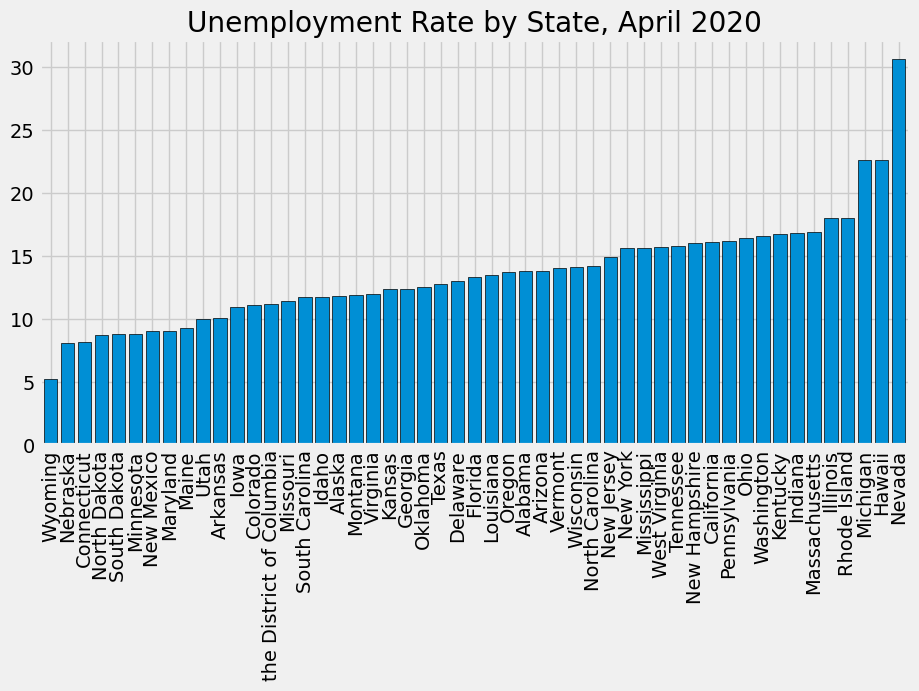

In [11]:
ax = unemp_states.loc[unemp_states.index == '2020-04-01'].T \
.sort_values('2020-04-01') \
.plot(kind='bar', figsize=(10,5), width =0.8, edgecolor = 'black', 
      title= 'Unemployment Rate by State, April 2020')
ax.legend().remove()
plt.show()

# Pull Participation Rate

In [12]:
part_df = fred.search('participation rate state', filter =('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
part_df = part_df.loc[part_df['title'].str.contains('Participation Rate for')]
part_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
LBSSA06,LBSSA06,2024-02-14,2024-02-14,Labor Force Participation Rate for California,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:03-06:00,16,A state's labor-force participation rate is th...
LBSSA01,LBSSA01,2024-02-14,2024-02-14,Labor Force Participation Rate for Alabama,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:04-06:00,12,A state's labor-force participation rate is th...
LBSSA21,LBSSA21,2024-02-14,2024-02-14,Labor Force Participation Rate for Kentucky,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:03-06:00,24,A state's labor-force participation rate is th...
LBSSA36,LBSSA36,2024-02-14,2024-02-14,Labor Force Participation Rate for New York,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:02:03-06:00,23,A state's labor-force participation rate is th...
LBSSA26,LBSSA26,2024-02-14,2024-02-14,Labor Force Participation Rate for Michigan,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:02-06:00,23,A state's labor-force participation rate is th...
LBSSA27,LBSSA27,2024-02-14,2024-02-14,Labor Force Participation Rate for Minnesota,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:02-06:00,21,A state's labor-force participation rate is th...
LBSSA12,LBSSA12,2024-02-14,2024-02-14,Labor Force Participation Rate for Florida,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:02-06:00,21,A state's labor-force participation rate is th...
LBSSA48,LBSSA48,2024-02-14,2024-02-14,Labor Force Participation Rate for Texas,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:02:05-06:00,21,A state's labor-force participation rate is th...
LBSSA24,LBSSA24,2024-02-14,2024-02-14,Labor Force Participation Rate for Maryland,1976-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-23 09:03:03-06:00,19,A state's labor-force participation rate is th...


In [13]:
id_to_state_part = part_df['title'].str.replace('Labor Force Participation Rate for ', '').to_dict()

In [14]:
all_results = []

for myid in part_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
part_states = pd.concat(all_results, axis=1)

In [15]:
part_states.columns = [id_to_state_part[c] for c in part_states.columns]

In [16]:
part_states

,California,Alabama,Kentucky,New York,Michigan,Minnesota,Florida,Texas,Maryland,West Virginia,Wisconsin,Louisiana,Ohio,Colorado,Georgia,Massachusetts,North Carolina,Mississippi,Arizona,Oklahoma,Pennsylvania,Virginia,Nebraska,Utah,Tennessee,New Mexico,Illinois,South Carolina,Washington,Iowa,Maine,Oregon,Indiana,New Jersey,Alaska,Missouri,South Dakota,Idaho,Montana,Connecticut,New Hampshire,Nevada,Kansas,Rhode Island,Vermont,Arkansas,Wyoming,North Dakota,Hawaii,Delaware,District Of Columbia
1976-01-01,62.6,57.0,60.5,58.0,61.6,65.6,55.8,63.8,64.3,52.5,65.6,56.8,61.7,67.2,63.7,64.8,66.5,58.8,59.5,59.3,58.4,65.9,64.9,62.8,59.6,60.8,63.0,65.3,60.9,64.4,62.1,62.9,64.0,61.5,69.0,60.5,64.6,63.0,62.7,64.2,65.9,71.3,65.1,63.8,63.6,57.9,65.3,62.6,69.9,62.7,64.4
1976-02-01,62.4,56.9,60.3,58.0,61.5,65.5,55.7,63.5,64.2,52.4,65.5,56.6,61.7,67.0,63.6,64.7,66.3,58.6,59.2,59.2,58.3,65.8,64.9,62.6,59.4,60.5,63.0,65.2,60.7,64.3,61.9,62.7,63.9,61.4,68.4,60.3,64.4,62.8,62.5,64.1,65.6,70.8,65.0,63.7,63.4,57.8,64.9,62.4,69.6,62.5,64.5
1976-03-01,62.2,56.8,60.2,58.0,61.5,65.4,55.5,63.4,64.1,52.3,65.4,56.5,61.7,66.8,63.5,64.6,66.2,58.5,59.1,59.1,58.3,65.6,64.8,62.5,59.3,60.3,62.9,65.0,60.6,64.2,61.9,62.5,63.8,61.4,67.8,60.3,64.4,62.7,62.4,64.0,65.6,70.5,64.9,63.6,63.2,57.7,64.7,62.3,69.6,62.5,64.5
1976-04-01,62.2,56.8,60.1,58.0,61.6,65.4,55.5,63.5,64.1,52.3,65.4,56.4,61.6,66.6,63.5,64.6,66.2,58.5,59.1,59.0,58.3,65.5,64.8,62.5,59.3,60.3,62.9,64.9,60.6,64.1,61.8,62.4,63.8,61.5,67.9,60.4,64.3,62.7,62.3,64.1,65.7,70.4,65.0,63.7,63.5,57.7,64.9,62.5,69.4,62.4,64.5
1976-05-01,62.3,56.8,60.1,58.1,61.7,65.5,55.4,63.6,64.1,52.2,65.5,56.4,61.6,66.5,63.6,64.6,66.3,58.5,59.1,59.0,58.3,65.4,64.8,62.6,59.4,60.3,63.0,64.7,60.7,64.1,61.7,62.5,63.9,61.6,67.9,60.6,64.3,62.8,62.2,64.3,66.0,70.5,65.1,63.6,63.6,57.7,65.2,62.6,69.3,62.4,64.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-01,62.4,57.0,57.6,61.5,61.3,68.5,59.7,64.2,65.3,54.9,65.7,59.0,62.1,68.7,61.4,64.5,60.8,54.3,61.8,61.8,61.9,66.7,69.2,69.8,59.4,57.2,64.4,57.0,64.6,68.7,58.6,61.7,63.5,65.5,65.2,63.7,67.8,62.4,62.7,64.1,64.6,61.7,66.7,63.3,64.0,57.7,64.5,69.5,60.2,60.3,70.9
2023-09-01,62.3,57.0,57.4,61.6,61.6,68.5,59.8,64.2,65.2,55.1,65.8,58.9,62.1,68.6,61.5,64.4,60.9,54.1,61.9,62.1,61.9,66.8,69.2,69.7,59.4,57.2,64.5,57.0,64.5,68.6,58.7,61.7,63.4,65.4,65.2,63.7,67.8,62.4,62.6,64.1,64.6,61.9,66.7,63.4,64.1,57.8,64.4,69.3,60.2,60.5,71.1
2023-10-01,62.3,57.0,57.3,61.6,61.8,68.5,59.8,64.2,65.2,55.2,65.8,58.8,62.0,68.4,61.6,64.5,60.9,53.9,62.0,62.3,61.9,66.8,69.1,69.6,59.4,57.2,64.5,57.0,64.3,68.4,58.8,61.7,63.3,65.2,65.1,63.6,67.8,62.4,62.6,64.1,64.7,62.1,66.7,63.5,64.2,57.8,64.2,69.2,60.1,60.6,71.4
2023-11-01,62.2,57.1,57.1,61.7,62.1,68.3,59.7,64.2,65.2,55.2,65.9,58.8,62.0,68.4,61.6,64.6,60.9,53.8,62.1,62.5,62.0,66.9,69.0,69.5,59.4,57.3,64.7,57.0,64.3,68.1,59.0,61.8,63.3,65.1,65.2,63.5,67.7,62.5,62.6,64.1,64.8,62.4,66.6,63.7,64.4,57.7,64.2,69.1,60.1,60.6,71.6


In [17]:
px.line(part_states)

# Unemployment vs Participation

In [18]:
unemp_states = unemp_states.rename(columns={'the District of Columbia' : 'District Of Columbia'})

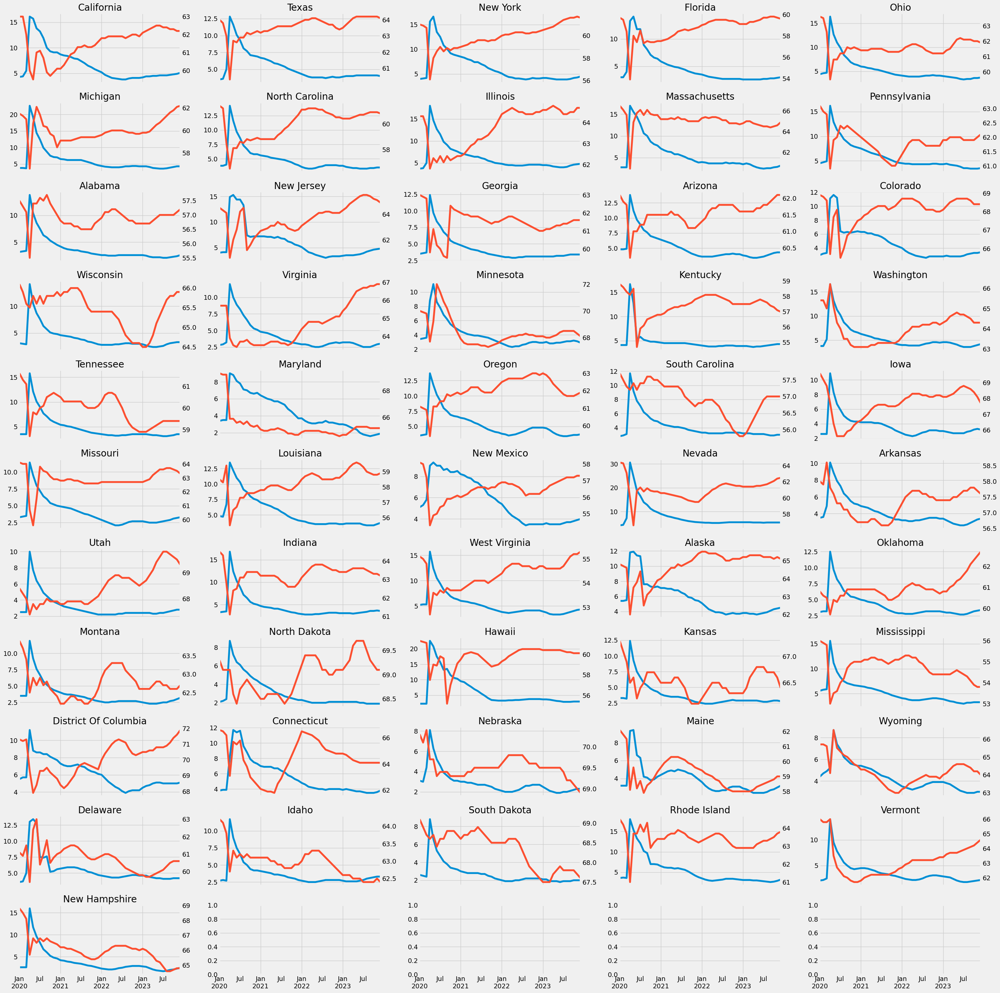

In [19]:
num_states = len(unemp_states.columns)

num_columns = 5
num_rows = -(-num_states // num_columns)

fig, axs = plt.subplots(num_rows, num_columns, figsize=(30, 30), sharex =True )
axs = axs.flatten()

i = 0
for state in unemp_states.columns:
    if state == "District of Columbia":
        continue
    ax2 = axs[i].twinx()
    unemp_states.query('index >= 2020 and index <= 2024')[state].plot(ax=axs[i], label='Unemployment')
    part_states.query('index >= 2020 and index <= 2024')[state].plot(ax=ax2, label='Participation', color=color_pal[1])
    ax2.grid(False)
    axs[i].set_title(state)
    i += 1
plt.tight_layout()
plt.show()